In [1]:
# import standard library
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
# Set Pandas display options to show all columns
pd.set_option('display.max_columns', None)

In [2]:
# Define file paths for train, test, and RUL data
train_paths = ['Dataset/train_FD001.txt', 'Dataset/train_FD002.txt', 'Dataset/train_FD003.txt', 'Dataset/train_FD004.txt']
test_paths = ['Dataset/test_FD001.txt', 'Dataset/test_FD002.txt', 'Dataset/test_FD003.txt', 'Dataset/test_FD004.txt']
rul_paths = ['Dataset/RUL_FD001.txt', 'Dataset/RUL_FD002.txt', 'Dataset/RUL_FD003.txt', 'Dataset/RUL_FD004.txt']

# Columns Name
index_names = ['engine_number', 'time_cycles']
setting_names = ['op_setting_1', 'op_setting_2', 'op_setting_3']
sensor_names = ['sensor_measurement{}'.format(i+1) for i in range(0,21)]
col_names = index_names + setting_names + sensor_names
rul_names = ['RUL']

In [3]:
def read_dataset(file_paths, col_names, rul_names=None):
    data_frames = []
    
    for path in file_paths:
        df = pd.read_csv(path, sep=' ', header=None, index_col=False, names=col_names)
        data_frames.append(df)
    
    return data_frames

In [4]:
# Read train, test, and RUL data
train_data = read_dataset(train_paths, col_names)
test_data = read_dataset(test_paths, col_names)
rul_data = read_dataset(rul_paths, rul_names)  # Make sure rul_names is defined before using it

# Access individual DataFrames
train1, train2, train3, train4 = train_data
test1, test2, test3, test4 = test_data
rul1, rul2, rul3, rul4 = rul_data

# store these DataFrames in a dictionary
datasets = {
    'train': train_data,
    'test': test_data,
    'rul': rul_data
}

C:\Users\miqba\AppData\Local\Temp\ipykernel_18496\2117408241.py:5: ParserWarning: Length of header or names does not match length of data. This leads to a loss of data with index_col=False.
  df = pd.read_csv(path, sep=' ', header=None, index_col=False, names=col_names)
C:\Users\miqba\AppData\Local\Temp\ipykernel_18496\2117408241.py:5: ParserWarning: Length of header or names does not match length of data. This leads to a loss of data with index_col=False.
  df = pd.read_csv(path, sep=' ', header=None, index_col=False, names=col_names)
C:\Users\miqba\AppData\Local\Temp\ipykernel_18496\2117408241.py:5: ParserWarning: Length of header or names does not match length of data. This leads to a loss of data with index_col=False.
  df = pd.read_csv(path, sep=' ', header=None, index_col=False, names=col_names)
C:\Users\miqba\AppData\Local\Temp\ipykernel_18496\2117408241.py:5: ParserWarning: Length of header or names does not match length of data. This leads to a loss of data with index_col=Fals

In [5]:
print("train1 shape:", train1.shape)
print("train2 shape:", train2.shape)
print("train3 shape:", train3.shape)
print("train4 shape:", train4.shape)
print("test1 shape:", test1.shape)
print("test2 shape:", test2.shape)
print("test3 shape:", test3.shape)
print("test4 shape:", test4.shape)
print("rul1 shape:", rul1.shape)
print("rul2 shape:", rul2.shape)
print("rul3 shape:", rul3.shape)
print("rul4 shape:", rul4.shape)

train1 shape: (20631, 26)
train2 shape: (53759, 26)
train3 shape: (24720, 26)
train4 shape: (61249, 26)
test1 shape: (13096, 26)
test2 shape: (33991, 26)
test3 shape: (16596, 26)
test4 shape: (41214, 26)
rul1 shape: (100, 1)
rul2 shape: (259, 1)
rul3 shape: (100, 1)
rul4 shape: (248, 1)


# First dataset Train and Test

In [6]:
train1.head()

,engine_number,time_cycles,op_setting_1,op_setting_2,op_setting_3,sensor_measurement1,sensor_measurement2,sensor_measurement3,sensor_measurement4,sensor_measurement5,sensor_measurement6,sensor_measurement7,sensor_measurement8,sensor_measurement9,sensor_measurement10,sensor_measurement11,sensor_measurement12,sensor_measurement13,sensor_measurement14,sensor_measurement15,sensor_measurement16,sensor_measurement17,sensor_measurement18,sensor_measurement19,sensor_measurement20,sensor_measurement21
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,21.61,554.36,2388.06,9046.19,1.3,47.47,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,21.61,553.75,2388.04,9044.07,1.3,47.49,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,21.61,554.26,2388.08,9052.94,1.3,47.27,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,21.61,554.45,2388.11,9049.48,1.3,47.13,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,21.61,554.00,2388.06,9055.15,1.3,47.28,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044


In [7]:
test1.head()

,engine_number,time_cycles,op_setting_1,op_setting_2,op_setting_3,sensor_measurement1,sensor_measurement2,sensor_measurement3,sensor_measurement4,sensor_measurement5,sensor_measurement6,sensor_measurement7,sensor_measurement8,sensor_measurement9,sensor_measurement10,sensor_measurement11,sensor_measurement12,sensor_measurement13,sensor_measurement14,sensor_measurement15,sensor_measurement16,sensor_measurement17,sensor_measurement18,sensor_measurement19,sensor_measurement20,sensor_measurement21
0,1,1,0.0023,0.0003,100.0,518.67,643.02,1585.29,1398.21,14.62,21.61,553.90,2388.04,9050.17,1.3,47.20,521.72,2388.03,8125.55,8.4052,0.03,392,2388,100.0,38.86,23.3735
1,1,2,-0.0027,-0.0003,100.0,518.67,641.71,1588.45,1395.42,14.62,21.61,554.85,2388.01,9054.42,1.3,47.50,522.16,2388.06,8139.62,8.3803,0.03,393,2388,100.0,39.02,23.3916
2,1,3,0.0003,0.0001,100.0,518.67,642.46,1586.94,1401.34,14.62,21.61,554.11,2388.05,9056.96,1.3,47.50,521.97,2388.03,8130.10,8.4441,0.03,393,2388,100.0,39.08,23.4166
3,1,4,0.0042,0.0000,100.0,518.67,642.44,1584.12,1406.42,14.62,21.61,554.07,2388.03,9045.29,1.3,47.28,521.38,2388.05,8132.90,8.3917,0.03,391,2388,100.0,39.00,23.3737
4,1,5,0.0014,0.0000,100.0,518.67,642.51,1587.19,1401.92,14.62,21.61,554.16,2388.01,9044.55,1.3,47.31,522.15,2388.03,8129.54,8.4031,0.03,390,2388,100.0,38.99,23.4130


In [8]:
# Check null values
train1.isnull().sum()

engine_number           0
time_cycles             0
op_setting_1            0
op_setting_2            0
op_setting_3            0
sensor_measurement1     0
sensor_measurement2     0
sensor_measurement3     0
sensor_measurement4     0
sensor_measurement5     0
sensor_measurement6     0
sensor_measurement7     0
sensor_measurement8     0
sensor_measurement9     0
sensor_measurement10    0
sensor_measurement11    0
sensor_measurement12    0
sensor_measurement13    0
sensor_measurement14    0
sensor_measurement15    0
sensor_measurement16    0
sensor_measurement17    0
sensor_measurement18    0
sensor_measurement19    0
sensor_measurement20    0
sensor_measurement21    0
dtype: int64

In [9]:
test1.isnull().sum()

engine_number           0
time_cycles             0
op_setting_1            0
op_setting_2            0
op_setting_3            0
sensor_measurement1     0
sensor_measurement2     0
sensor_measurement3     0
sensor_measurement4     0
sensor_measurement5     0
sensor_measurement6     0
sensor_measurement7     0
sensor_measurement8     0
sensor_measurement9     0
sensor_measurement10    0
sensor_measurement11    0
sensor_measurement12    0
sensor_measurement13    0
sensor_measurement14    0
sensor_measurement15    0
sensor_measurement16    0
sensor_measurement17    0
sensor_measurement18    0
sensor_measurement19    0
sensor_measurement20    0
sensor_measurement21    0
dtype: int64

train1 and test1 dataset does not have any missing values

In [10]:
# duplicated row
print(train1.duplicated().sum())
print(test1.duplicated().sum())

0
0


train1 and test1 dataset does not have any duplicated rows

In [11]:
train1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20631 entries, 0 to 20630
Data columns (total 26 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   engine_number         20631 non-null  int64  
 1   time_cycles           20631 non-null  int64  
 2   op_setting_1          20631 non-null  float64
 3   op_setting_2          20631 non-null  float64
 4   op_setting_3          20631 non-null  float64
 5   sensor_measurement1   20631 non-null  float64
 6   sensor_measurement2   20631 non-null  float64
 7   sensor_measurement3   20631 non-null  float64
 8   sensor_measurement4   20631 non-null  float64
 9   sensor_measurement5   20631 non-null  float64
 10  sensor_measurement6   20631 non-null  float64
 11  sensor_measurement7   20631 non-null  float64
 12  sensor_measurement8   20631 non-null  float64
 13  sensor_measurement9   20631 non-null  float64
 14  sensor_measurement10  20631 non-null  float64
 15  sensor_measurement1

In [12]:
test1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13096 entries, 0 to 13095
Data columns (total 26 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   engine_number         13096 non-null  int64  
 1   time_cycles           13096 non-null  int64  
 2   op_setting_1          13096 non-null  float64
 3   op_setting_2          13096 non-null  float64
 4   op_setting_3          13096 non-null  float64
 5   sensor_measurement1   13096 non-null  float64
 6   sensor_measurement2   13096 non-null  float64
 7   sensor_measurement3   13096 non-null  float64
 8   sensor_measurement4   13096 non-null  float64
 9   sensor_measurement5   13096 non-null  float64
 10  sensor_measurement6   13096 non-null  float64
 11  sensor_measurement7   13096 non-null  float64
 12  sensor_measurement8   13096 non-null  float64
 13  sensor_measurement9   13096 non-null  float64
 14  sensor_measurement10  13096 non-null  float64
 15  sensor_measurement1

train1 and test1 dataset does not have categorical values

In [13]:
rul1

,RUL
0,112
1,98
2,69
3,82
4,91
...,...
95,137
96,82
97,59
98,117


# Statistical Analysis

In [14]:
train1[['engine_number', 'time_cycles']].describe().T

,count,mean,std,min,25%,50%,75%,max
engine_number,20631.0,51.506568,29.227633,1.0,26.0,52.0,77.0,100.0
time_cycles,20631.0,108.807862,68.880990,1.0,52.0,104.0,156.0,362.0


In [15]:
train1[['op_setting_1', 'op_setting_2','op_setting_3']].describe().T

,count,mean,std,min,25%,50%,75%,max
op_setting_1,20631.0,-0.000009,0.002187,-0.0087,-0.0015,0.0,0.0015,0.0087
op_setting_2,20631.0,0.000002,0.000293,-0.0006,-0.0002,0.0,0.0003,0.0006
op_setting_3,20631.0,100.000000,0.000000,100.0000,100.0000,100.0,100.0000,100.0000


op_setting_3 shows constant values.

In [16]:
train1[['sensor_measurement1', 'sensor_measurement2',
       'sensor_measurement3', 'sensor_measurement4', 'sensor_measurement5',
       'sensor_measurement6', 'sensor_measurement7', 'sensor_measurement8',
       'sensor_measurement9', 'sensor_measurement10', 'sensor_measurement11',
       'sensor_measurement12', 'sensor_measurement13', 'sensor_measurement14',
       'sensor_measurement15', 'sensor_measurement16', 'sensor_measurement17',
       'sensor_measurement18', 'sensor_measurement19', 'sensor_measurement20',
       'sensor_measurement21']].describe().T

,count,mean,std,min,25%,50%,75%,max
sensor_measurement1,20631.0,518.670000,6.537152e-11,518.6700,518.6700,518.6700,518.6700,518.6700
sensor_measurement2,20631.0,642.680934,5.000533e-01,641.2100,642.3250,642.6400,643.0000,644.5300
sensor_measurement3,20631.0,1590.523119,6.131150e+00,1571.0400,1586.2600,1590.1000,1594.3800,1616.9100
sensor_measurement4,20631.0,1408.933782,9.000605e+00,1382.2500,1402.3600,1408.0400,1414.5550,1441.4900
sensor_measurement5,20631.0,14.620000,3.394700e-12,14.6200,14.6200,14.6200,14.6200,14.6200
sensor_measurement6,20631.0,21.609803,1.388985e-03,21.6000,21.6100,21.6100,21.6100,21.6100
sensor_measurement7,20631.0,553.367711,8.850923e-01,549.8500,552.8100,553.4400,554.0100,556.0600
sensor_measurement8,20631.0,2388.096652,7.098548e-02,2387.9000,2388.0500,2388.0900,2388.1400,2388.5600
sensor_measurement9,20631.0,9065.242941,2.208288e+01,9021.7300,9053.1000,9060.6600,9069.4200,9244.5900
sensor_measurement10,20631.0,1.300000,4.660829e-13,1.3000,1.3000,1.3000,1.3000,1.3000


sensor_measurement1,sensor_measurement5,sensor_measurement6,sensor_measurement8,sensor_measurement10,
sensor_measurement13,sensor_measurement16,sensor_measurement18,sensor_measurement19 have constant values

In [17]:
# Number of engine
train1['engine_number'].unique()

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100], dtype=int64)

In [18]:
#max cycle of engine
train1.groupby('engine_number')['time_cycles'].max()

engine_number
1      192
2      287
3      179
4      189
5      269
      ... 
96     336
97     202
98     156
99     185
100    200
Name: time_cycles, Length: 100, dtype: int64

In [19]:
train1[train1['engine_number'] == 1].groupby('engine_number')['time_cycles'].max()

engine_number
1    192
Name: time_cycles, dtype: int64

In [20]:
# Skewness in Data
threshold = 0.5

skewed_columns = train1.skew()
skewed_columns = skewed_columns[abs(skewed_columns) > threshold]

print("Columns with skewness exceeding {}:".format(threshold))
print(skewed_columns)

Columns with skewness exceeding 0.5:
sensor_measurement6    -6.916813
sensor_measurement9     2.555365
sensor_measurement14    2.372554
dtype: float64


# Visualisation

In [21]:
# Checking Distribution every single column
#for i in train1.columns:
#    sns.displot(train1[i],kde=True)
#    plt.title(f'Distribution of {i}')
#    plt.show()

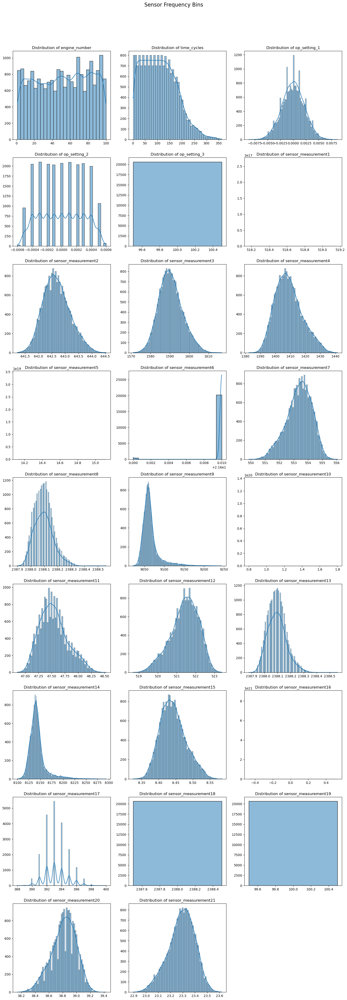

In [22]:
def plot_three_columns_per_row(data_frame):
    num_columns = len(data_frame.columns)
    num_rows = (num_columns + 2) // 3  # Calculate the number of rows needed for 3 columns per row

    fig, axes = plt.subplots(num_rows, 3, figsize=(15, 5*num_rows))

    # Add a title to the entire plot
    fig.suptitle('Sensor Frequency Bins', fontsize=16)

    for i, col in enumerate(data_frame.columns):
        row = i // 3
        col_num = i % 3

        sns.histplot(data_frame[col], kde=True, ax=axes[row, col_num])
        axes[row, col_num].set_title(f'Distribution of {col}')
        axes[row, col_num].set_xlabel('')
        axes[row, col_num].set_ylabel('')

    # Remove any empty subplots in the last row if the number of columns is not a multiple of 3
    if num_columns % 3 != 0:
        for j in range(num_columns % 3, 3):
            fig.delaxes(axes[num_rows - 1, j])

    # Adjust layout to make space for the title above the subplots
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])

    # Save the plot as an image file (e.g., PNG)
    plt.savefig('Sensor Frequency Bins.png', bbox_inches='tight')

    # Show the plot (you can comment this line out if you only want to save the image)
    plt.show()

# Call the function to plot three graphs per row for your DataFrame
plot_three_columns_per_row(train1)

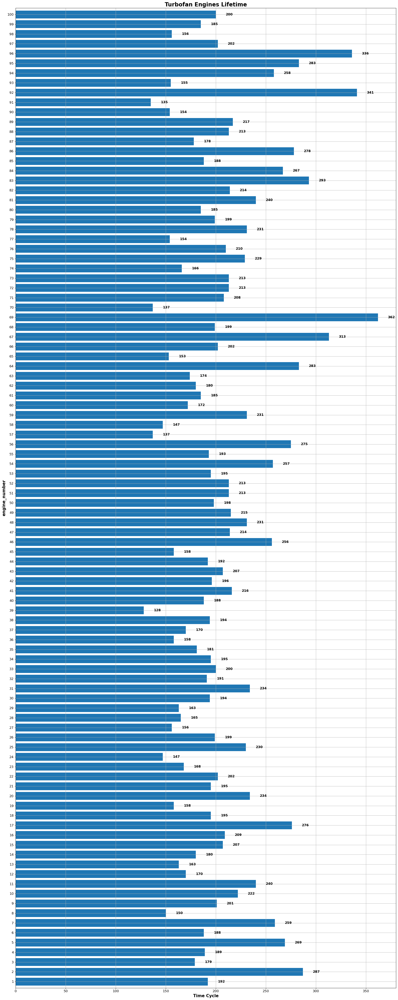

In [5]:
def plot_max_time_cycles(data_frame, index_column, value_column, figsize=(20, 10), save_filename=None):
    max_time_cycles = data_frame.groupby(index_column)[value_column].max()
    
    plt.figure(figsize=figsize)
    ax = max_time_cycles.plot(kind='barh', stacked=True, width=0.8, align='center')
    
    plt.title('Turbofan Engines Lifetime', fontweight='bold', size=20)
    plt.xlabel('Time Cycle', fontweight='bold', size=15)
    plt.ylabel(index_column, fontweight='bold', size=15)
    plt.xticks(size=12)
    plt.yticks(size=12)
    plt.grid(True)
    
    # Annotate bars with the number of cycles at the end
    for i, v in enumerate(max_time_cycles):
        ax.text(v + 10, i, str(v), color='black', fontweight='bold', va='center', size=12)
    
    plt.tight_layout()
    
    # Save the plot as an image file (e.g., PNG) if a save_filename is provided
    if save_filename:
        plt.savefig(save_filename, bbox_inches='tight')
    
    plt.show()

# Call the function to create the stacked bar plot and save it as an image
plot_max_time_cycles(train1, index_column='engine_number', value_column='time_cycles', figsize=(20, 50), save_filename='max_time_cycles.png')


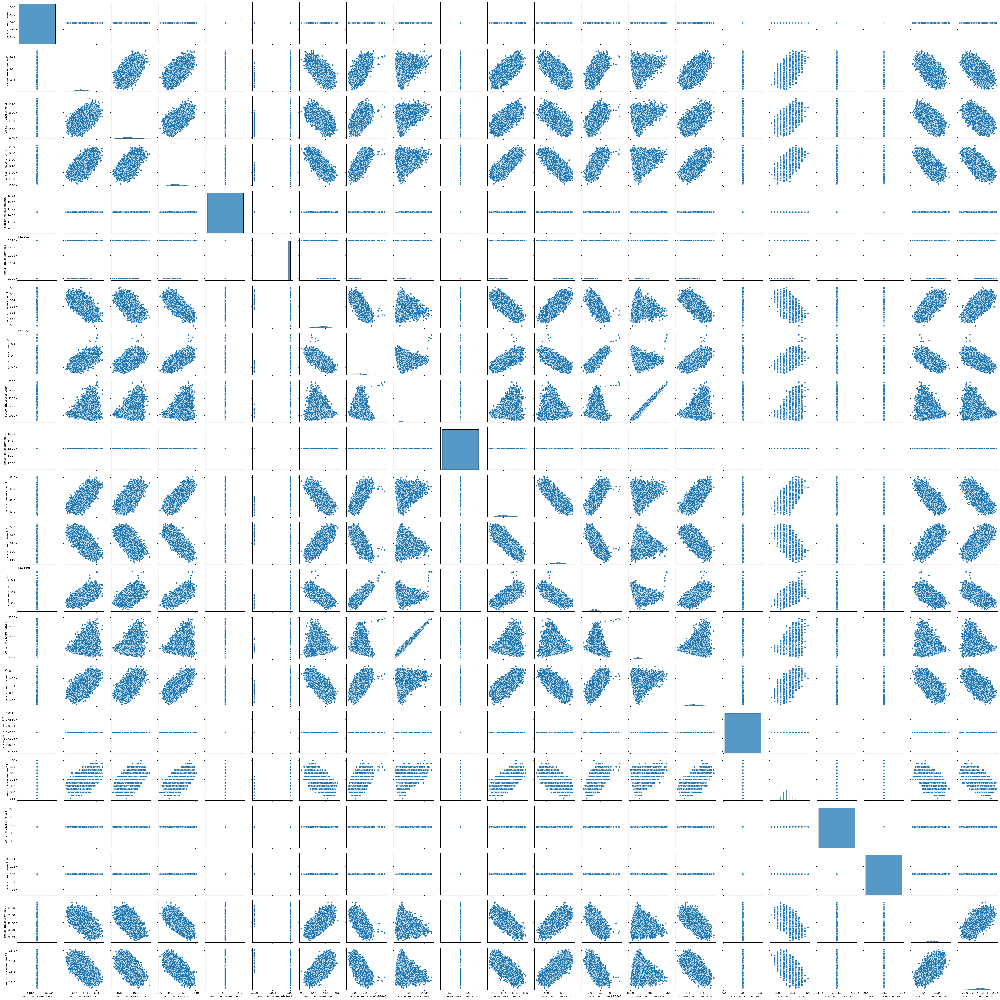

In [24]:
# pairplot omly for sensor data 
columns_to_plot = ['sensor_measurement1', 'sensor_measurement2', 'sensor_measurement3', 'sensor_measurement4', 'sensor_measurement5', 'sensor_measurement6', 'sensor_measurement7', 'sensor_measurement8', 'sensor_measurement9', 'sensor_measurement10', 'sensor_measurement11', 'sensor_measurement12', 'sensor_measurement13', 'sensor_measurement14', 'sensor_measurement15', 'sensor_measurement16', 'sensor_measurement17', 'sensor_measurement18', 'sensor_measurement19', 'sensor_measurement20', 'sensor_measurement21']

sns.pairplot(train1[columns_to_plot])

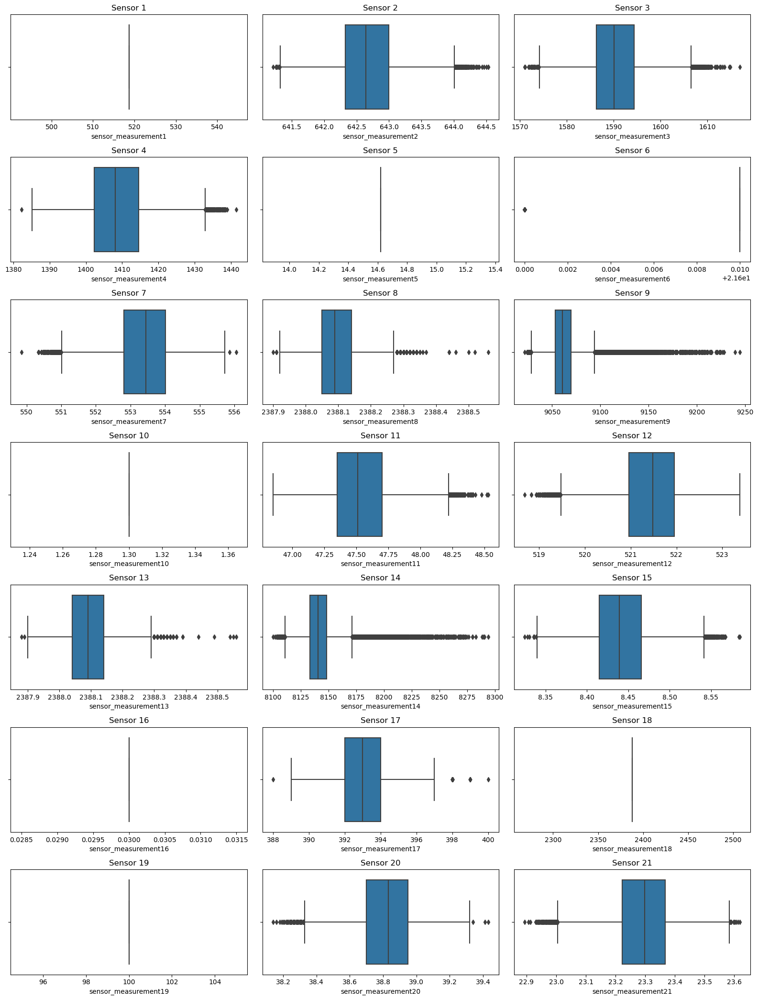

In [25]:
# Check Outliers only for sensor data
plt.figure(figsize=(16, 21))

for i in range(21):
    temp_data = train1.iloc[:, i + 5]
    plt.subplot(7, 3, i + 1)
    sns.boxplot(x=temp_data)
    plt.title("Sensor " + str(i + 1))

plt.tight_layout()
plt.show()

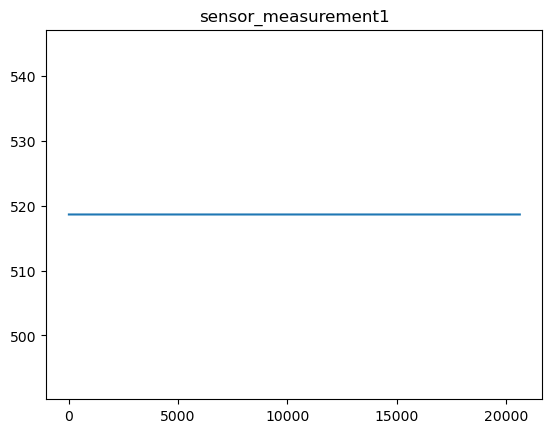

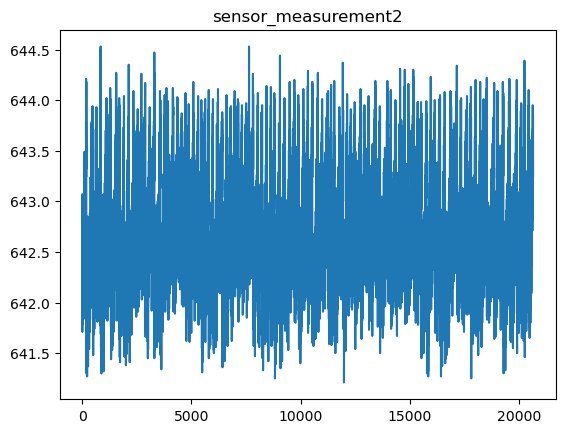

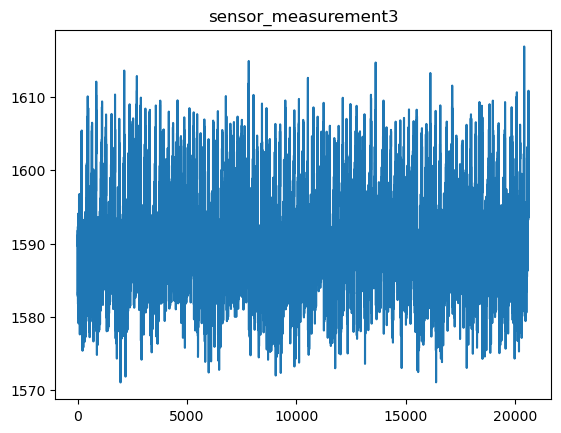

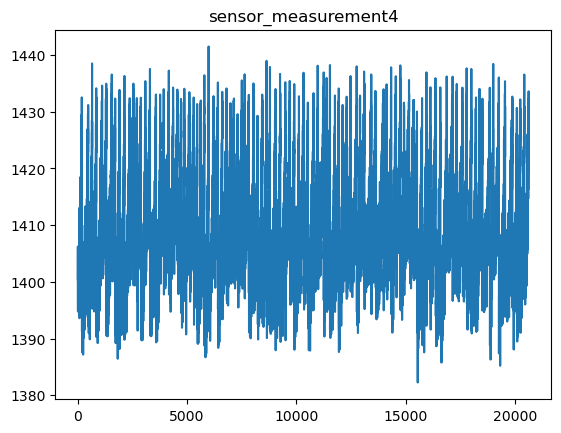

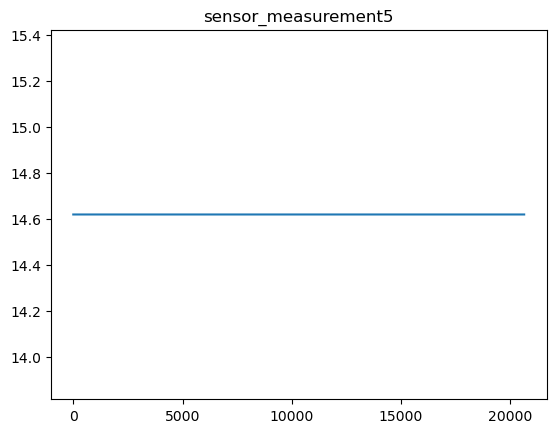

...

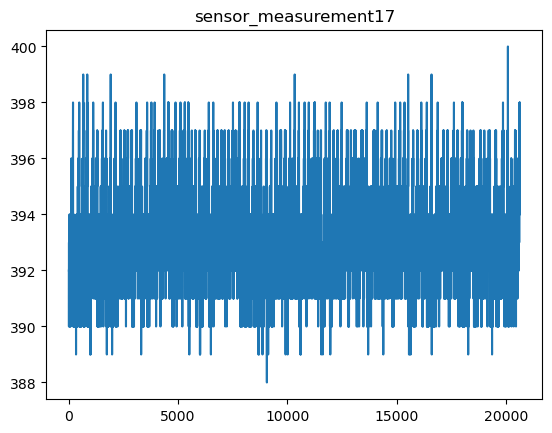

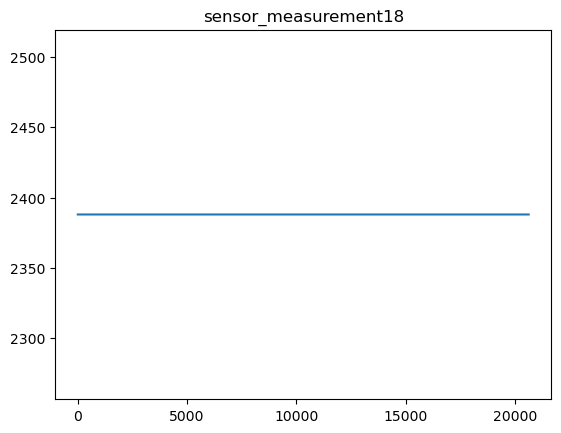

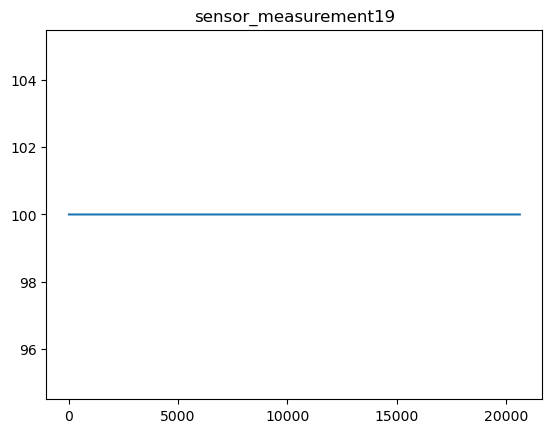

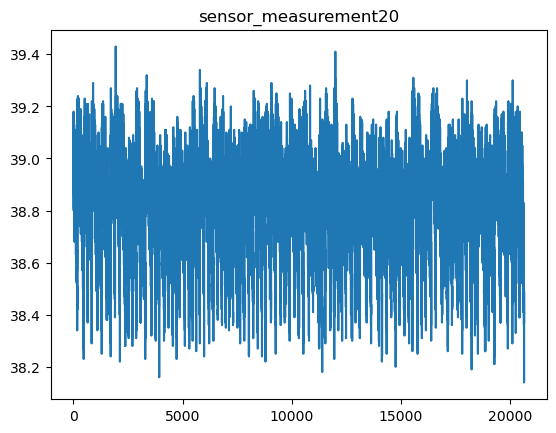

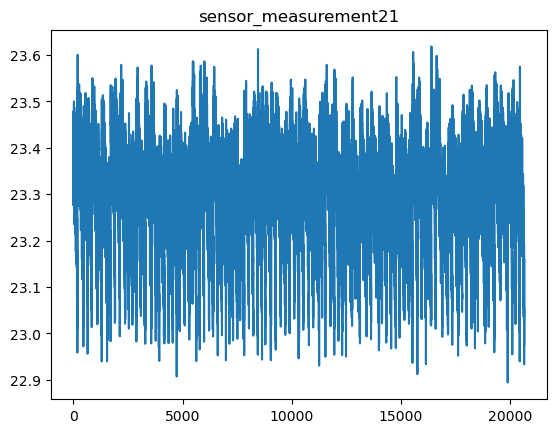

In [26]:
columns_to_plot = ['sensor_measurement1', 'sensor_measurement2', 'sensor_measurement3', 'sensor_measurement4', 'sensor_measurement5', 'sensor_measurement6', 'sensor_measurement7', 'sensor_measurement8', 'sensor_measurement9', 'sensor_measurement10', 'sensor_measurement11', 'sensor_measurement12', 'sensor_measurement13', 'sensor_measurement14', 'sensor_measurement15', 'sensor_measurement16', 'sensor_measurement17', 'sensor_measurement18', 'sensor_measurement19', 'sensor_measurement20', 'sensor_measurement21']

for column in columns_to_plot:
    train1[column].plot()
    plt.title(column)
    plt.show()

**Sensor 1,5,6,10,16,18,19** have contain constant values

Other sensor Have some Outliers

Number of columns in train1: 26
Number of columns in test1: 26


C:\Users\miqba\AppData\Local\Temp\ipykernel_6500\4035177489.py:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(temp_train, color="blue", label="Train")
C:\Users\miqba\AppData\Local\Temp\ipykernel_6500\4035177489.py:26: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(temp_test, color="red", label="Test")
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
C:\Users\miqba\AppData\Local\Temp\ipykernel_6500\4035177489.py:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(temp_train, color="blue", label="Train")
C:\Users\miqba\AppData\Local\Temp\ipykernel_6500\4035177489.py:26: UserWarning: Dataset has 0 variance; skipping density estimate. P

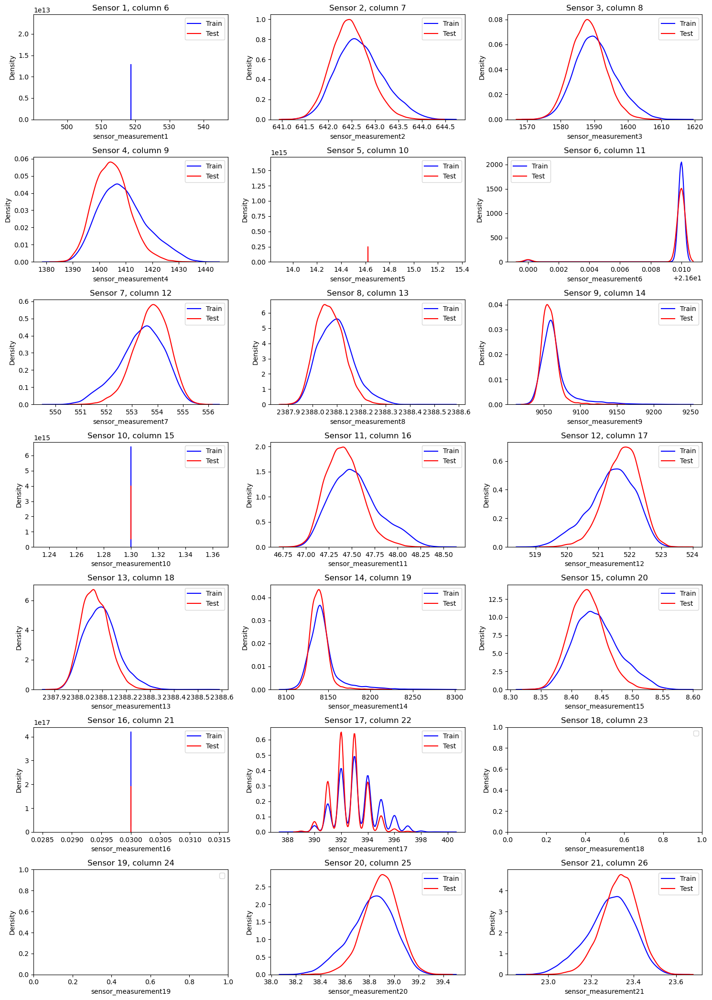

In [27]:
# Check the number of columns in train1 and test1
num_train_columns = len(train1.columns)
num_test_columns = len(test1.columns)

# Print the number of columns
print("Number of columns in train1:", num_train_columns)
print("Number of columns in test1:", num_test_columns)

# Compare only sensor data
columns_to_compare = [5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26]

# Make sure columns_to_compare contains valid indices
valid_columns_to_compare = [col_idx for col_idx in columns_to_compare if col_idx < num_train_columns]

# Loop through valid columns
plt.figure(figsize=(15, 21))
for i, j in enumerate(valid_columns_to_compare):
    # Check if the column data type is numeric or datetime
    if train1.iloc[:, j].dtype in ['float64', 'int64', 'datetime64[ns]']:
        temp_train = train1.iloc[:, j]
        temp_test = test1.iloc[:, j]

        plt.subplot(7, 3, i + 1)

        sns.kdeplot(temp_train, color="blue", label="Train")
        sns.kdeplot(temp_test, color="red", label="Test")

        plt.title("Sensor " + str(j - 4) + ", column " + str(j + 1))
        plt.legend()

plt.tight_layout()
plt.show()

**Sensor 1,5,6,10,16,18,19** have contain constant values

In [28]:
# Variance Inflation Factor (VIF)

from statsmodels.stats.outliers_influence import variance_inflation_factor

independepnt_features = train1[['engine_number', 'time_cycles', 'op_setting_1', 'op_setting_2',
       'op_setting_3', 'sensor_measurement1', 'sensor_measurement2',
       'sensor_measurement3', 'sensor_measurement4', 'sensor_measurement5',
       'sensor_measurement6', 'sensor_measurement7', 'sensor_measurement8',
       'sensor_measurement9', 'sensor_measurement10', 'sensor_measurement11',
       'sensor_measurement12', 'sensor_measurement13', 'sensor_measurement14',
       'sensor_measurement15', 'sensor_measurement16', 'sensor_measurement17',
       'sensor_measurement18', 'sensor_measurement19', 'sensor_measurement20',
       'sensor_measurement21']]

# Calculate VIF for each variable
vif_data = pd.DataFrame()
vif_data["Variable"] = independepnt_features.columns
vif_data["VIF"] = [variance_inflation_factor(independepnt_features.values, i) for i in range(independepnt_features.shape[1])]

print(vif_data)

C:\Users\miqba\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1752: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss


                Variable           VIF
0          engine_number  1.018797e+00
1            time_cycles  2.127847e+00
2           op_setting_1  1.002206e+00
3           op_setting_2  1.001180e+00
4           op_setting_3  0.000000e+00
5    sensor_measurement1  0.000000e+00
6    sensor_measurement2  2.640700e+00
7    sensor_measurement3  2.292889e+00
8    sensor_measurement4  4.601266e+00
9    sensor_measurement5  6.872649e-09
10   sensor_measurement6  1.031593e+00
11   sensor_measurement7  4.346194e+00
12   sensor_measurement8  4.714878e+00
13   sensor_measurement9  1.789142e+01
14  sensor_measurement10  0.000000e+00
15  sensor_measurement11  6.034983e+00
16  sensor_measurement12  5.302668e+00
17  sensor_measurement13  4.703138e+00
18  sensor_measurement14  1.728159e+01
19  sensor_measurement15  3.304846e+00
20  sensor_measurement16  2.001162e-07
21  sensor_measurement17  2.564762e+00
22  sensor_measurement18  0.000000e+00
23  sensor_measurement19  0.000000e+00
24  sensor_measurement20 

**engine_number:** This variable has a VIF of approximately 1.02, indicating low multicollinearity.

**time_cycles:** This variable has a VIF of approximately 2.13, suggesting moderate multicollinearity.

**op_setting_1 and op_setting_2:** These two variables have VIF values close to 1, indicating low multicollinearity.

**op_setting_3, sensor_measurement1, sensor_measurement10, sensor_measurement11, sensor_measurement18, and sensor_measurement19:** These variables have VIF values of 0, which could mean that they are not correlated with the other variables in your model.

**sensor_measurement4, sensor_measurement7, sensor_measurement8, sensor_measurement9, and sensor_measurement14:** These variables have relatively high VIF values, suggesting high multicollinearity. You may want to investigate these variables further to see if there's a need to remove or transform them in your regression analysis.

Other sensor measurement variables have VIF values that vary between low to moderate multicollinearity.

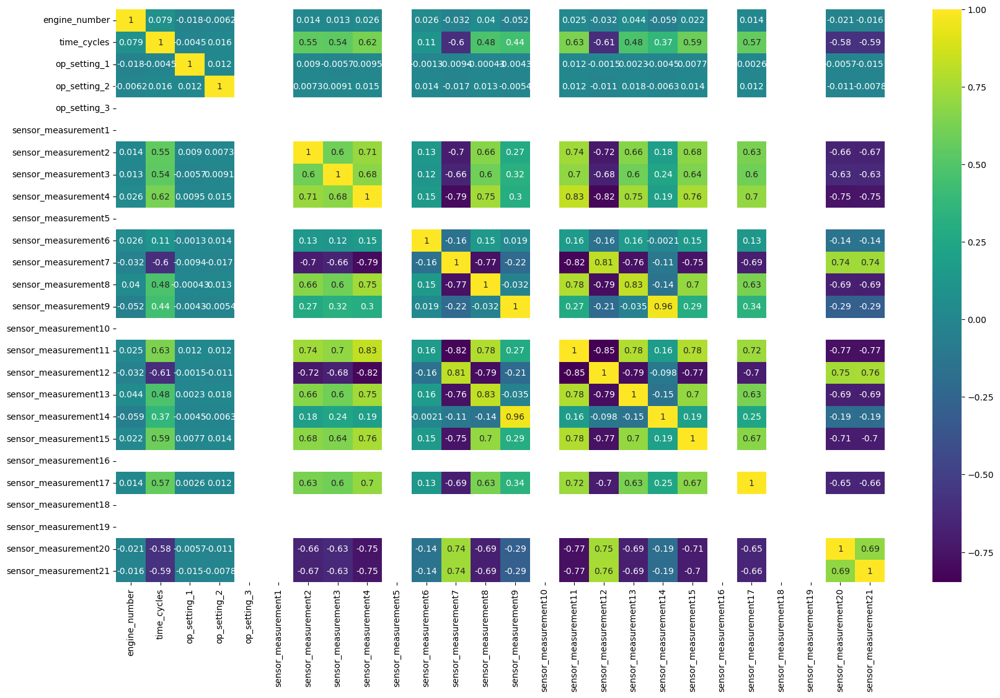

In [8]:
#correlation
plt.figure(figsize=(20,12))
sns.heatmap(train1.corr(),annot=True,cmap='viridis')
# Save the heatmap as a .png file
plt.savefig('heatmap.png',bbox_inches='tight')
# Display the heatmap (optional)
plt.show()

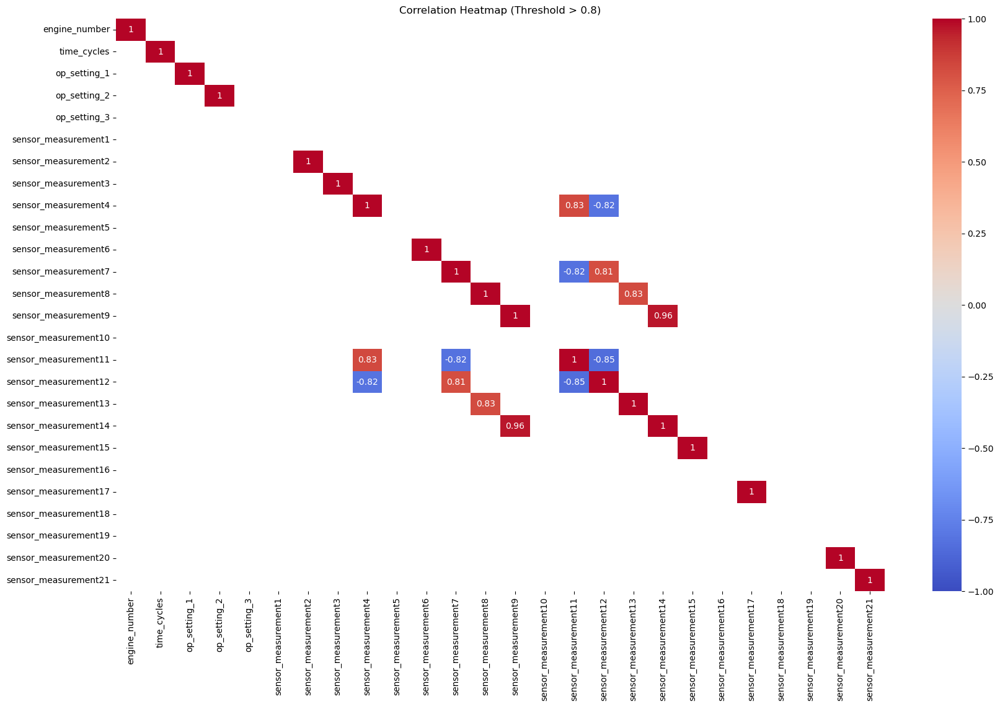

In [7]:
# Calculate the correlation matrix with threshold 0.8
correlation_matrix = train1.corr()

# Create a mask to display only correlations above the threshold
threshold = 0.8
mask = correlation_matrix.applymap(lambda x: abs(x) > threshold)

# Create a heatmap
plt.figure(figsize=(20, 12))
sns.heatmap(correlation_matrix[mask], annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title(f'Correlation Heatmap (Threshold > {threshold})')
plt.savefig('corelation.png')
plt.show()

In [31]:
# Find columns with correlations greater than 0.8
correlation_threshold = 0.8
highly_correlated_columns = []
for column in correlation_matrix.columns:
    correlated_columns = [col for col in correlation_matrix.index if col != column and abs(correlation_matrix[column][col]) > correlation_threshold]
    if correlated_columns:
        highly_correlated_columns.append((column, correlated_columns))

# Display the columns with correlations greater than 0.8
for pair in highly_correlated_columns:
    print(f"Feature '{pair[0]}' and {', '.join(pair[1])} have a correlation greater than {correlation_threshold}.")

Feature 'sensor_measurement4' and sensor_measurement11, sensor_measurement12 have a correlation greater than 0.8.
Feature 'sensor_measurement7' and sensor_measurement11, sensor_measurement12 have a correlation greater than 0.8.
Feature 'sensor_measurement8' and sensor_measurement13 have a correlation greater than 0.8.
Feature 'sensor_measurement9' and sensor_measurement14 have a correlation greater than 0.8.
Feature 'sensor_measurement11' and sensor_measurement4, sensor_measurement7, sensor_measurement12 have a correlation greater than 0.8.
Feature 'sensor_measurement12' and sensor_measurement4, sensor_measurement7, sensor_measurement11 have a correlation greater than 0.8.
Feature 'sensor_measurement13' and sensor_measurement8 have a correlation greater than 0.8.
Feature 'sensor_measurement14' and sensor_measurement9 have a correlation greater than 0.8.


In [32]:
rul1['engine_number'] = rul1.index + 1

In [33]:
# save complet train and test data into csv file
train1.to_csv('RawData/Train1_raw.csv', header=True, index=False)
test1.to_csv('RawData/Test1_raw.csv', header=True, index=False)
rul1.to_csv('RawData/Rul1_raw.csv', header=True, index=False)